In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/toronto-twitter-tweets/Twitter_Toronto_Tweets.csv


In [2]:
data = pd.read_csv('/kaggle/input/toronto-twitter-tweets/Twitter_Toronto_Tweets.csv')
data.head()

,Tweet ID,User ID,Tweet Content,Timestamp,Location,Retweets,Likes,Hashtags
0,fb7d0633-5396-4cbd-9d87-d04dfb22499a,17191034-b9ff-47b0-8b0f-4067e308079d,Just attended Taylor Swift's Eras Tour at Roge...,2024-11-22 21:39:19,"Rogers Centre, Toronto",725,844,#TaylorSwift'sErasTour
1,ae3f1746-267b-423f-b1ee-9977d228ab18,a21ddcaa-6f97-4876-946d-43a8a0d51dfa,Just attended Toronto Light Festival at Distil...,2024-02-22 15:12:04,"Distillery District, Toronto",964,1396,#TorontoLightFestival
2,1ec46248-d43f-480e-84de-601bacf42bf0,cb47df04-e0ad-4a34-8107-e0aa03c497d0,Score each cause. Quality throughout beautiful...,2024-11-17 08:17:20,"Rogers Centre, Toronto",832,581,#TaylorSwift'sErasTour
3,3e4db8a5-6c23-4b03-98c7-f1e39a82ac24,a776bada-5d9c-49a1-8e3d-51db8d3494b0,Just attended Toronto International Boat Show ...,2024-01-19 15:34:22,"Enercare Centre, Toronto",252,2327,#TorontoInternationalBoatShow
4,c560c9d5-d378-4dbe-b586-fb0bf4d9660b,eb93c2b6-745c-4d70-b0d5-775e133aae36,Stop peace technology officer relate. Product ...,2024-01-21 05:28:23,"Enercare Centre, Toronto",400,2624,#TorontoInternationalBoatShow


In [3]:
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
df = pd.read_csv('/kaggle/input/toronto-twitter-tweets/Twitter_Toronto_Tweets.csv')

# Display the first few rows of the dataset
df.head()

,Tweet ID,User ID,Tweet Content,Timestamp,Location,Retweets,Likes,Hashtags
0,fb7d0633-5396-4cbd-9d87-d04dfb22499a,17191034-b9ff-47b0-8b0f-4067e308079d,Just attended Taylor Swift's Eras Tour at Roge...,2024-11-22 21:39:19,"Rogers Centre, Toronto",725,844,#TaylorSwift'sErasTour
1,ae3f1746-267b-423f-b1ee-9977d228ab18,a21ddcaa-6f97-4876-946d-43a8a0d51dfa,Just attended Toronto Light Festival at Distil...,2024-02-22 15:12:04,"Distillery District, Toronto",964,1396,#TorontoLightFestival
2,1ec46248-d43f-480e-84de-601bacf42bf0,cb47df04-e0ad-4a34-8107-e0aa03c497d0,Score each cause. Quality throughout beautiful...,2024-11-17 08:17:20,"Rogers Centre, Toronto",832,581,#TaylorSwift'sErasTour
3,3e4db8a5-6c23-4b03-98c7-f1e39a82ac24,a776bada-5d9c-49a1-8e3d-51db8d3494b0,Just attended Toronto International Boat Show ...,2024-01-19 15:34:22,"Enercare Centre, Toronto",252,2327,#TorontoInternationalBoatShow
4,c560c9d5-d378-4dbe-b586-fb0bf4d9660b,eb93c2b6-745c-4d70-b0d5-775e133aae36,Stop peace technology officer relate. Product ...,2024-01-21 05:28:23,"Enercare Centre, Toronto",400,2624,#TorontoInternationalBoatShow


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Tweet ID       10000 non-null  object
 1   User ID        10000 non-null  object
 2   Tweet Content  10000 non-null  object
 3   Timestamp      10000 non-null  object
 4   Location       10000 non-null  object
 5   Retweets       10000 non-null  int64 
 6   Likes          10000 non-null  int64 
 7   Hashtags       10000 non-null  object
dtypes: int64(2), object(6)
memory usage: 625.1+ KB


In [5]:
print(df.isnull().sum())

Tweet ID         0
User ID          0
Tweet Content    0
Timestamp        0
Location         0
Retweets         0
Likes            0
Hashtags         0
dtype: int64


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


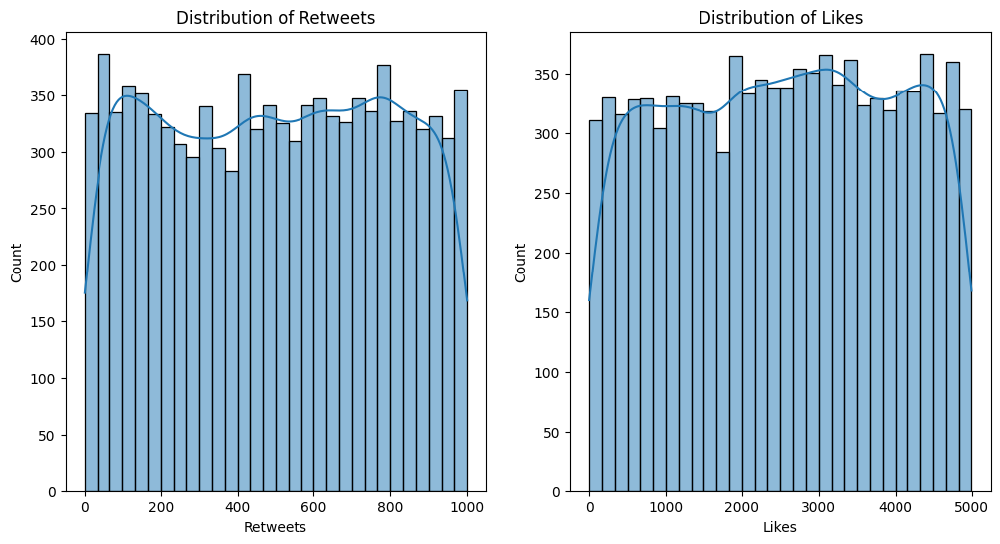

In [6]:
# Distribution of Retweets and Likes
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(df['Retweets'], bins=30, kde=True)
plt.title('Distribution of Retweets')
plt.subplot(1, 2, 2)
sns.histplot(df['Likes'], bins=30, kde=True)
plt.title('Distribution of Likes')
plt.show()

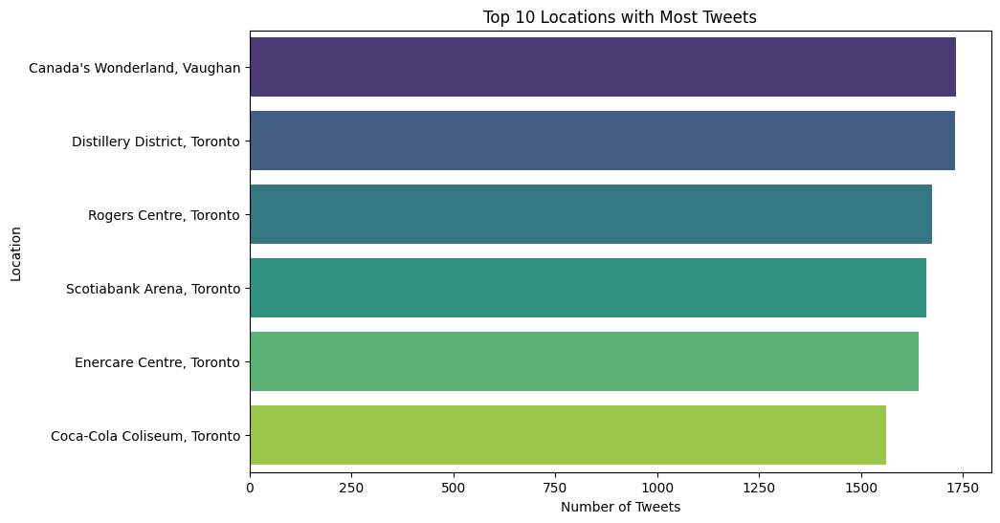

In [7]:
top_locations = df['Location'].value_counts().head(10)
plt.figure(figsize=(10, 6))
sns.barplot(x=top_locations.values, y=top_locations.index, palette='viridis')
plt.title('Top 10 Locations with Most Tweets')
plt.xlabel('Number of Tweets')
plt.ylabel('Location')
plt.show()

                                       Tweet Content  Sentiment  \
0  Just attended Taylor Swift's Eras Tour at Roge...      0.750   
1  Just attended Toronto Light Festival at Distil...      0.625   
2  Score each cause. Quality throughout beautiful...      0.425   
3  Just attended Toronto International Boat Show ...      0.375   
4  Stop peace technology officer relate. Product ...      0.375   

  Sentiment_Label  
0        Positive  
1        Positive  
2        Positive  
3        Positive  
4        Positive  


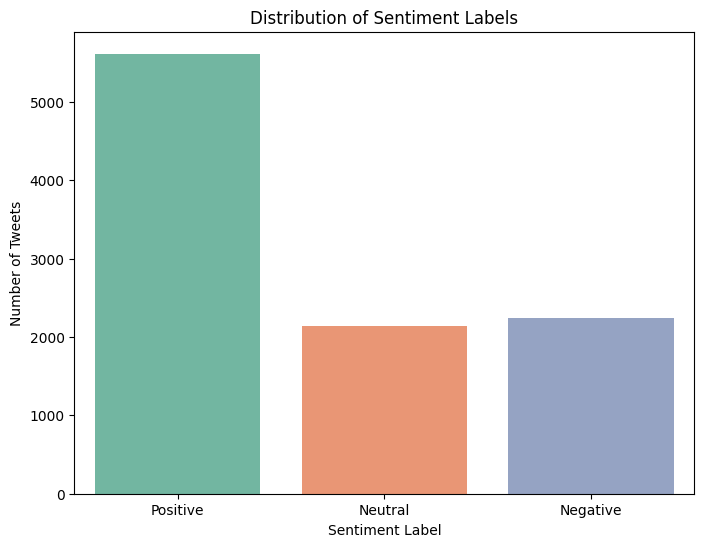

In [8]:
from textblob import TextBlob

# Function to get sentiment polarity
def get_sentiment(text):
    analysis = TextBlob(text)
    return analysis.sentiment.polarity

# Apply sentiment analysis to the tweet content
df['Sentiment'] = df['Tweet Content'].apply(get_sentiment)

# Classify sentiment as Positive, Neutral, or Negative
df['Sentiment_Label'] = df['Sentiment'].apply(lambda x: 'Positive' if x > 0 else ('Neutral' if x == 0 else 'Negative'))

# Display the first few rows with sentiment analysis
print(df[['Tweet Content', 'Sentiment', 'Sentiment_Label']].head())

# Distribution of Sentiment Labels
plt.figure(figsize=(8, 6))
sns.countplot(x='Sentiment_Label', data=df, palette='Set2')
plt.title('Distribution of Sentiment Labels')
plt.xlabel('Sentiment Label')
plt.ylabel('Number of Tweets')
plt.show()

In [10]:
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
from tqdm import tqdm  # For progress bar
import time

# Initialize the geocoder
geolocator = Nominatim(user_agent="toronto_emotion_map")

# Function to get latitude and longitude from location name
def get_lat_lon(location):
    try:
        # Add ", Toronto" to the location string to improve geocoding accuracy
        location = geolocator.geocode(location + ", Toronto", timeout=10)
        if location:  # Check if the location was found
            return (location.latitude, location.longitude)
        else:
            return (None, None)
    except Exception as e:
        return (None, None)

# Apply geocoding to the Location column with a progress bar
latitudes = []
longitudes = []

# Add a delay between requests to avoid hitting rate limits
delay = 1  # 1 second delay between requests

for location in tqdm(df['Location'], desc="Geocoding Locations"):
    lat, lon = get_lat_lon(location)
    latitudes.append(lat)
    longitudes.append(lon)
    time.sleep(delay)  # Add delay to avoid rate limits

# Add latitude and longitude columns to the dataframe
df['Latitude'] = latitudes
df['Longitude'] = longitudes

# Drop rows with missing latitude and longitude
df = df.dropna(subset=['Latitude', 'Longitude'])

# Display the first few rows with latitude and longitude
print(df[['Location', 'Latitude', 'Longitude']].head())

Geocoding Locations: 100%|██████████| 10000/10000 [3:15:44<00:00,  1.17s/it] 

                       Location   Latitude  Longitude
0        Rogers Centre, Toronto  43.641660 -79.389198
1  Distillery District, Toronto  43.650295 -79.359540
2        Rogers Centre, Toronto  43.641660 -79.389198
3      Enercare Centre, Toronto  43.635356 -79.413237
4      Enercare Centre, Toronto  43.635356 -79.413237


In [11]:
df.to_csv('modified_dataset_with_lat_lon.csv', index=False)

In [12]:
import folium
from folium.plugins import HeatMap

# Create a base map of Toronto
toronto_coords = [43.6532, -79.3832]  # Coordinates for Toronto
toronto_map = folium.Map(location=toronto_coords, zoom_start=12)

# Add a heatmap for sentiment distribution
heat_data = [[row['Latitude'], row['Longitude'], row['Sentiment']] for index, row in df.iterrows()]
HeatMap(heat_data).add_to(toronto_map)

# Save the map to an HTML file
toronto_map.save('toronto_sentiment_heatmap.html')

# Display the map
toronto_map

In [13]:
# Create a base map of Toronto
toronto_map = folium.Map(location=toronto_coords, zoom_start=12)

# Add markers for each tweet with sentiment color
for index, row in df.iterrows():
    sentiment = row['Sentiment']
    if sentiment > 0:
        color = 'green'  # Positive
    elif sentiment == 0:
        color = 'blue'   # Neutral
    else:
        color = 'red'    # Negative
    
    folium.CircleMarker(
        location=(row['Latitude'], row['Longitude']),
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=f"Sentiment: {row['Sentiment_Label']}<br>Tweet: {row['Tweet Content']}"
    ).add_to(toronto_map)

# Save the map to an HTML file
toronto_map.save('toronto_sentiment_map.html')

# Display the map
toronto_map